In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import rawpy

In [138]:
import scipy.signal

In [4]:
raw = rawpy.imread("IMG_0139.CR2")


In [219]:
rgb = raw.postprocess(demosaic_algorithm=rawpy.DemosaicAlgorithm.LMMSE,
                      output_bps=16, no_auto_bright=True, gamma=(2.5,3)).astype('float')
jupiter = rgb[2000:2700,2100:2800,:]

3


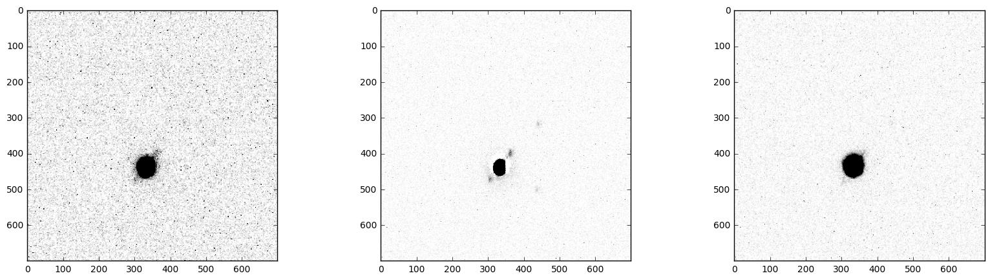

In [220]:
k = rgb.shape[2]
print k
figure(figsize=(5*(k+1),5))
for i in range(k):
    subplot(1,k,i+1)
    imshow(jupiter[:,:,i], vmin=0, vmax=10000, cmap=cm.gray_r, interpolation="none")

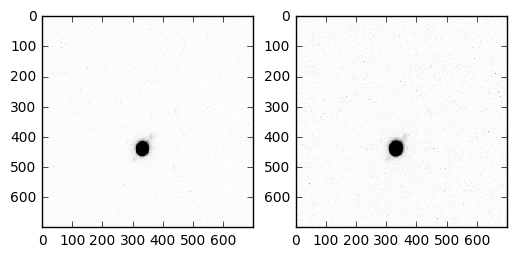

In [207]:
def lum(img):
    coeffs = [0.299, 0.587, 0.114 ]
    
    retval = np.zeros_like(img[:,:,0])
    for i, c_i in enumerate(coeffs):
        retval += c_i * img[:,:,i]**2
        
    return np.sqrt(retval)

subplot(1,2,1)
imshow(0.299*jupiter[:,:,0] + 0.587*jupiter[:,:,1] + 0.114*jupiter[:,:,2], vmin=0, vmax=10000, cmap=cm.gray_r, interpolation="none")
subplot(1,2,2)
imshow(lum(jupiter), vmin=0, vmax=10000, cmap=cm.gray_r, interpolation="none")

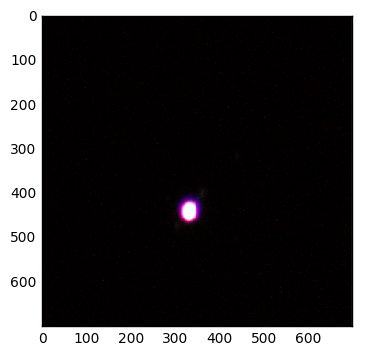

In [221]:
imshow((jupiter/256).astype(uint8), interpolation="none")

In [9]:
np.min(rgb[1100:1500,2300:2700,i]), np.max(rgb[1100:1500,2300:2700,i])

(0.0, 11623.0)

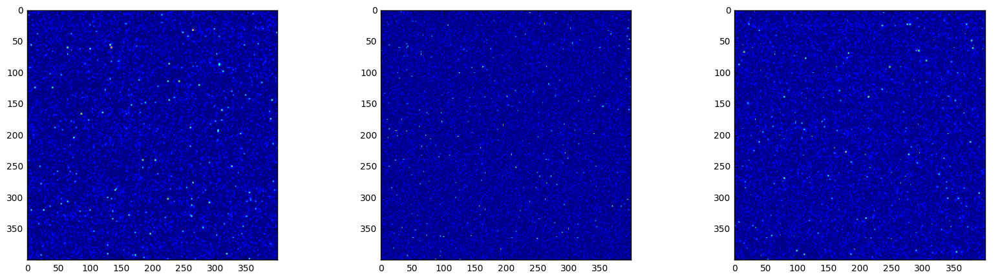

In [222]:
k = rgb.shape[2]

figure(figsize=(5*(k+1),5))
for i in range(k):
    subplot(1,k,i+1)
    imshow(rgb[1100:1500,2300:2700,i])

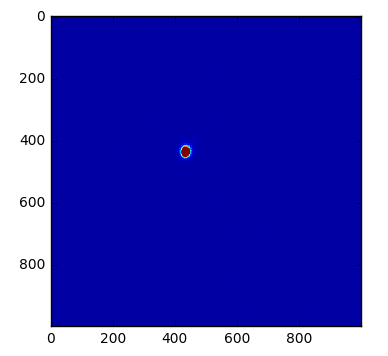

In [223]:
imshow(raw.raw_image_visible[2000:3000,2000:3000])

In [224]:
raw.raw_image_visible.shape

(3178, 4770)

In [225]:
def load_rgb(path, yrange=None, xrange=None):
    raw = rawpy.imread(path)
    rgb = raw.postprocess(demosaic_algorithm=rawpy.DemosaicAlgorithm.LINEAR,
                      output_bps=16, no_auto_bright=True, gamma=(2.5,3)).astype('float')

    if xrange and yrange:
        jupiter = rgb[yrange[0]:yrange[1],xrange[0]:xrange[1],:]
    else:
        jupiter = rgb
    return jupiter

(1000, 1000, 3)

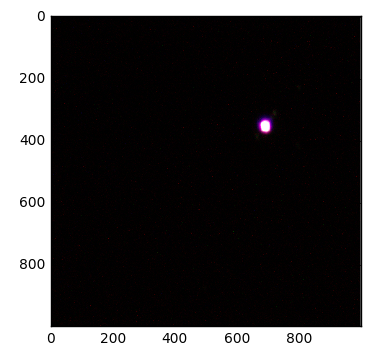

In [226]:
x = load_rgb("IMG_0150.CR2", (2000,3000),(2000,3000))
imshow((x/256).astype('uint8'), interpolation='none')
x.shape

In [227]:
def load_lum(path, yrange=None, xrange=None):
    jupiter = load_rgb(path, yrange, xrange)
    def lum(img):
        coeffs = [0.299, 0.587, 0.114 ]

        retval = np.zeros_like(img[:,:,0])
        for i, c_i in enumerate(coeffs):
            retval += c_i * img[:,:,i] # **2

        return retval # np.sqrt(retval)
    return lum(jupiter)

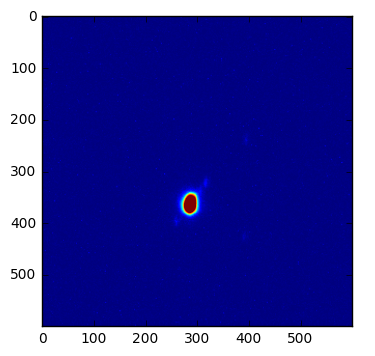

In [228]:
#jupiter = rgb[2000:2700,2100:2800,:]
yrange = (2000,2600)
xrange = (2400,3000)
frames = []
for i in range(146, 151):
    frames.append( load_lum("IMG_0%d.CR2" % i, yrange, xrange))
imshow(frames[0])

j = np.zeros_like(frames[0])
divisor = 0
for f in frames:
    j += f
    divisor += 1.0
j /= divisor

j_unaligned = j

In [229]:
def find_align(f0, f1,max_dx=30, max_dy=30):
    # Make a little low-pass donut filter
    k = np.zeros((3,3))
    k += 1
    k[1,1] = 0
    k /= np.sum(k)

    deltas = np.zeros((max_dy, max_dx))

    f0p = scipy.signal.convolve2d(f0, k, mode='same')
    f1p = scipy.signal.convolve2d(f1, k, mode='same')
    
    for dx in range(max_dx):
        for dy in range(max_dy):

            d = f1p[:-max_dy,:-max_dx] - f0p[dy:(dy-max_dy),dx:(dx-max_dx)]
            deltas[dy,dx] = np.sqrt(np.sum(d*d))

    return np.unravel_index(np.argmin(deltas), deltas.shape)

In [230]:
def load_stack(paths, yrange, xrange):
    frames = [ load_lum(paths[0], yrange, xrange)]
    
    for p in paths[1:]:
        f_orig = load_lum(p, yrange, xrange)
        o = find_align(frames[0], f_orig)
        yrp = (yrange[0]-o[0], yrange[1]-o[0])
        xrp = (xrange[0]-o[1], xrange[1]-o[1])
        f_aligned = load_lum(p, yrp, xrp)
        frames.append(f_aligned)
    return frames
paths = [ "IMG_0%d.CR2" % i for i in range(146, 151) ]
yrange = (2000,2600)
xrange = (2400,3000)
frames = load_stack(paths, yrange, xrange)

In [231]:
def load_stack_rgb(paths, yrange, xrange):
    f0_lum = load_lum(paths[0], yrange, xrange)
    
    frames = [ load_rgb(paths[0], yrange, xrange)]
    
    for p in paths[1:]:
        f1_lum = load_lum(p, yrange, xrange)
        o = find_align(f0_lum, f1_lum)
        yrp = (yrange[0]-o[0], yrange[1]-o[0])
        xrp = (xrange[0]-o[1], xrange[1]-o[1])
        f_aligned = load_rgb(p, yrp, xrp)
        frames.append(f_aligned)
    return frames
paths = [ "IMG_0%d.CR2" % i for i in range(146, 151) ]
yrange = (2000,2600)
xrange = (2400,3000)
frames = load_stack_rgb(paths, yrange, xrange)

In [232]:
frames[0].shape

(600, 600, 3)

In [233]:
j = np.zeros_like(frames[0])
divisor = 0
for f in frames:
    j += f
    divisor += 1.0
j /= divisor

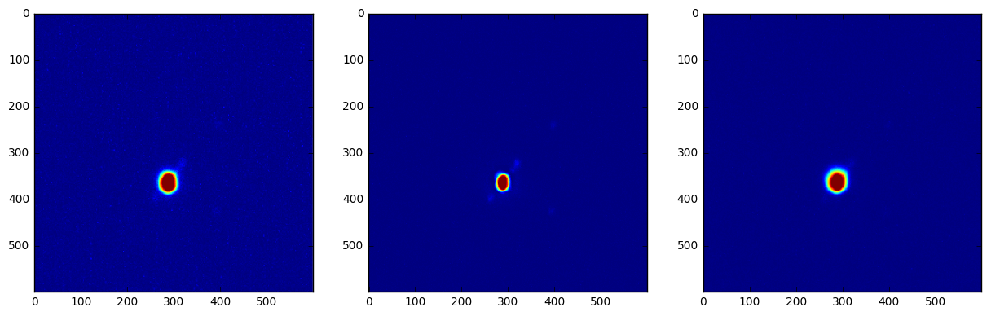

In [234]:
figure(figsize=(15,5))
for i in range(3):
    subplot(1,3,i+1)
    imshow(j[:,:,i], interpolation='none')
#imshow((j/256).astype('uint8'), interpolation='none')

In [235]:
j.shape

(600, 600, 3)

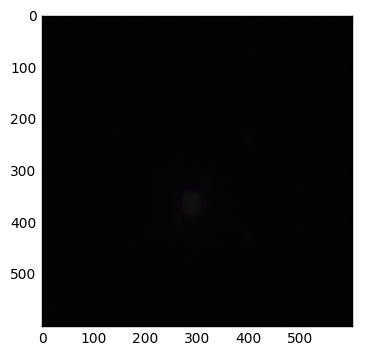

In [255]:
imshow((np.power(1+j, 0.25)).astype('uint8'))

In [257]:
paths = [ "IMG_0%d.CR2" % i for i in range(146, 151) ]
yrange = (2000,2600)
xrange = (2400,3000)
frames = load_stack(paths, yrange, xrange)

j = np.zeros_like(frames[0])
divisor = 0
for f in frames:
    j += f
    divisor += 1.0
j /= divisor

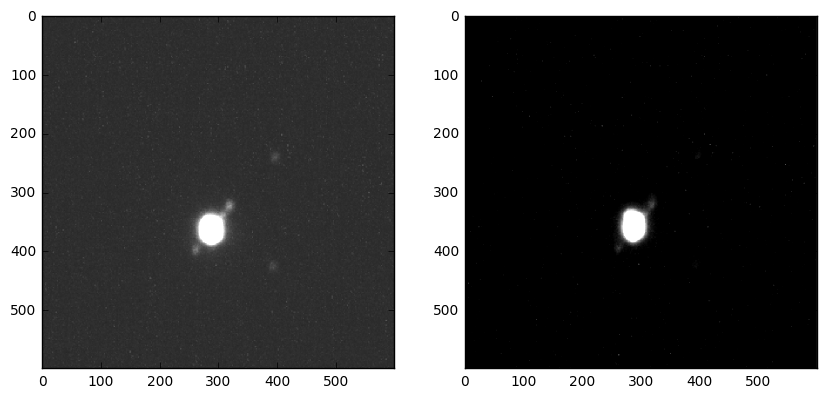

In [263]:
figure(figsize=(10,5))
subplot(1,2,1)
imshow(j, cmap=cm.gray, interpolation="none", vmin=-2000, vmax=11000)
subplot(1,2,2)
imshow(j_unaligned, cmap=cm.gray, interpolation="none", vmin=1000, vmax=15000)

In [267]:
from PIL import Image

In [274]:
j_threshold = j.copy()
j_threshold[j_threshold > 11000] = 10999
j_int = (((j_threshold+2000)/13000.0)*256).astype('uint8')
im = Image.fromarray(j_int)
im.save("foo.jpg")

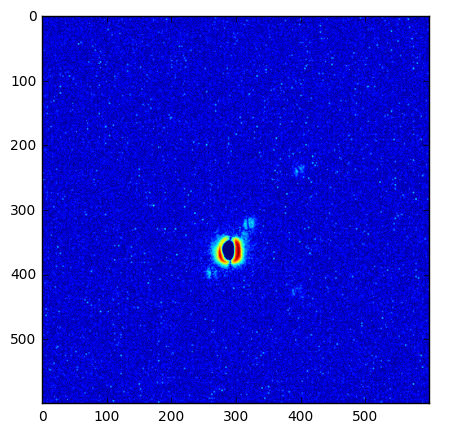

In [159]:
figure(figsize=(5,5))
imshow(np.sqrt(np.abs(frames[-1]-frames[0])))

In [75]:
k = np.zeros((3,3))
k += 1
k[1,1] = 0
k /= np.sum(k)
k

array([[ 0.125,  0.125,  0.125],
       [ 0.125,  0.   ,  0.125],
       [ 0.125,  0.125,  0.125]])

In [76]:
jp = scipy.signal.convolve2d(j, k, mode='same')
jp.shape, j.shape

((600, 600), (600, 600))

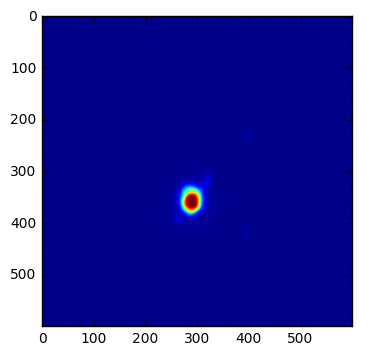

In [77]:
imshow(jp)

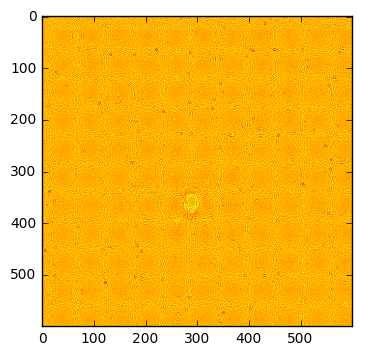

In [78]:
imshow(jp-j)

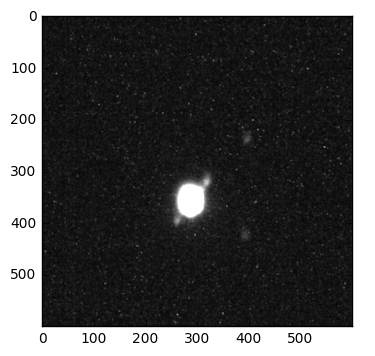

In [79]:
imshow(jp, cmap=cm.gray, interpolation="none", vmin=100, vmax=9000)

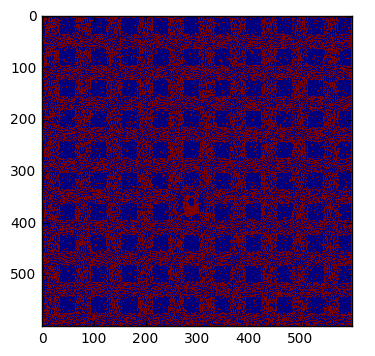

In [80]:
imshow(j > jp, interpolation="none")

In [81]:
dj = (j > jp).astype('float')
dj -= np.mean(dj)

In [82]:
fdj = np.fft.fft2(dj)
fdj.shape, fdj.dtype

((600, 600), dtype('complex128'))

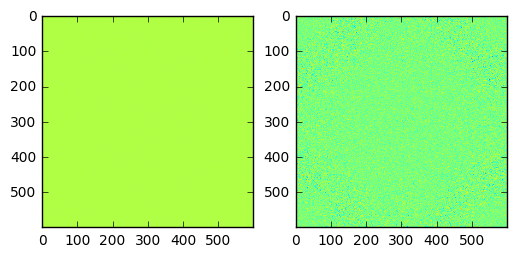

In [83]:
subplot(1,2,1)
imshow(np.real(fdj))
subplot(1,2,2)
imshow(np.imag(fdj))

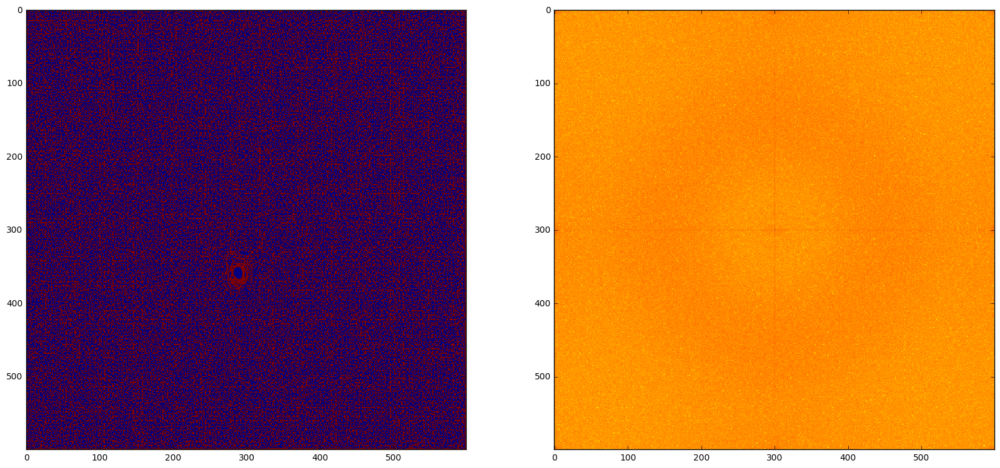

In [84]:
figure(figsize=(20,10))
subplot(1,2,1)
imshow(dj, interpolation='none')
subplot(1,2,2)
imshow(np.log(np.abs(np.fft.fftshift(fdj))**2), interpolation='none', vmin=-50, vmax=30)


In [30]:
np.min(np.log(np.abs(np.fft.fftshift(fdj))**2)), np.max(np.log(np.abs(np.fft.fftshift(fdj))**2))

(-51.356388758065115, 20.512720554383574)

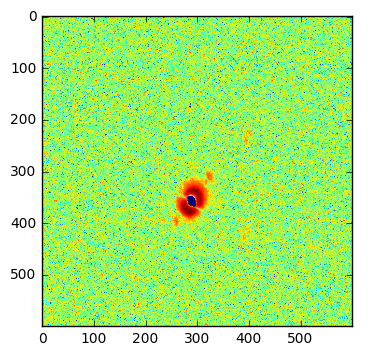

In [104]:
imshow(np.log(1+np.abs(frames[-1] - frames[0])))

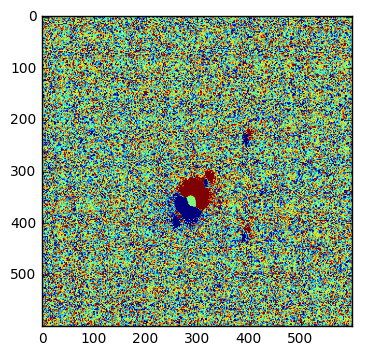

In [107]:
imshow(frames[-1] - frames[0], vmin=-1000,vmax=1000)

(12, 1)

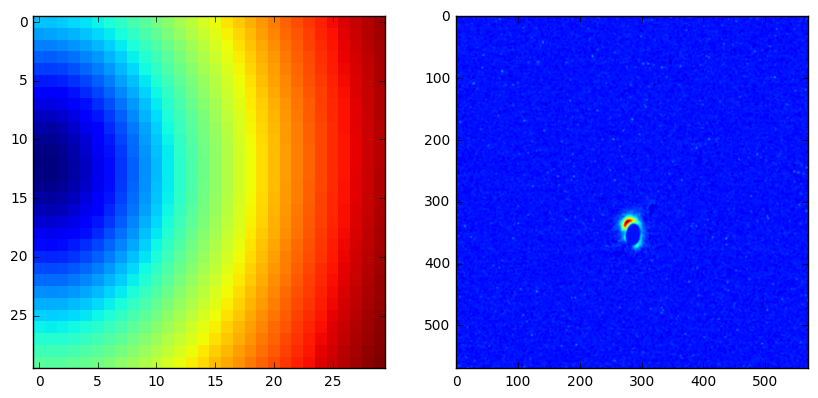

In [124]:
max_dx = 30
max_dy = 30

deltas = np.zeros((max_dy, max_dx))

f0 = frames[0]
f1 = frames[1]

f0p = scipy.signal.convolve2d(f0, k, mode='same')
f1p = scipy.signal.convolve2d(f1, k, mode='same')


for dx in range(max_dx):
    for dy in range(max_dy):
        
        d = f1[:-max_dy,:-max_dx] - f0[dy:(dy-max_dy),dx:(dx-max_dx)]
        deltas[dy,dx] = np.sqrt(np.sum(d*d))
        
figure(figsize=(10,5))
subplot(1,2,1)
imshow(deltas, interpolation='none'); None
subplot(1,2,2)
dy = 10
dx = 0
imshow(f1p[:-max_dy,:-max_dx] - f0p[dy:(dy-max_dy),dx:(dx-max_dx)])
np.unravel_index(np.argmin(deltas), deltas.shape)

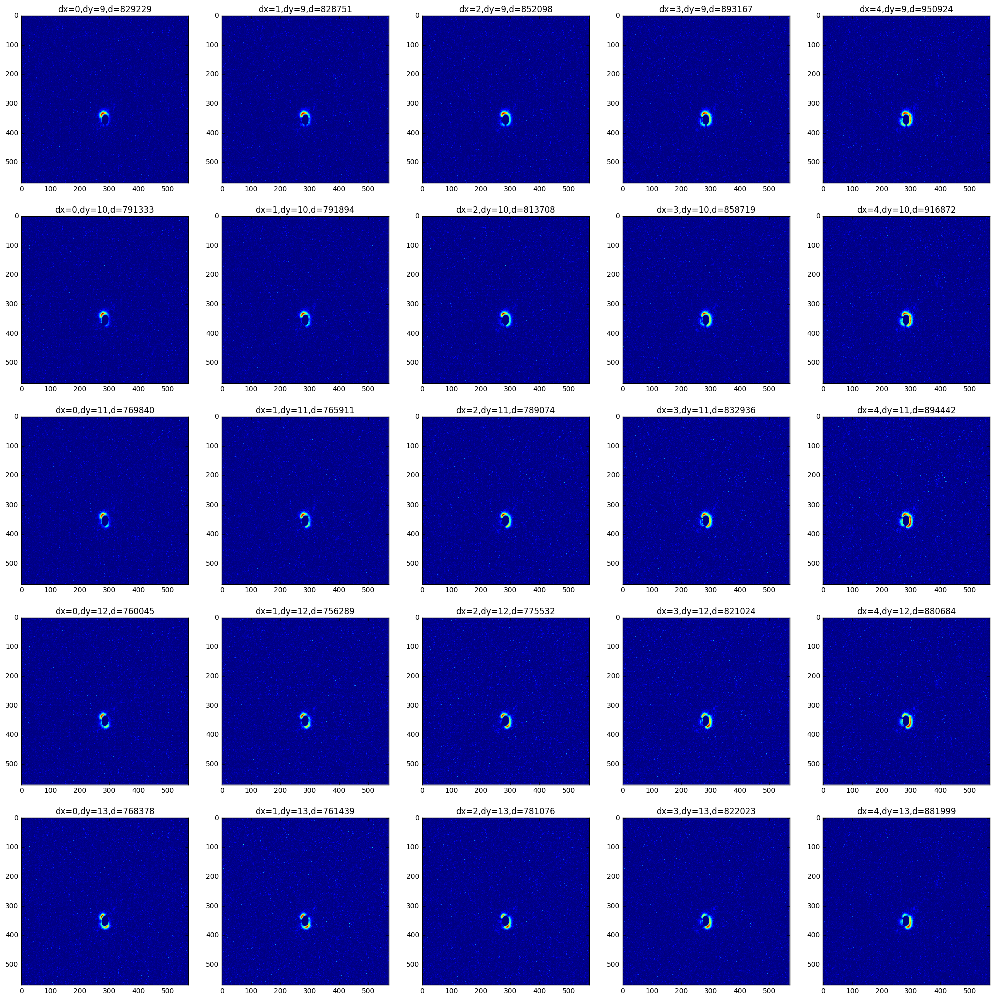

In [125]:
max_ddx = 5
max_ddy = 5
figure(figsize=(5*max_ddx,5*max_ddy))

dx0 = 0
dy0 = 9

for ddx in range(max_ddx):
    for ddy in range(max_ddy):
        subplot(max_ddx, max_ddy, max_ddx*ddy+ddx+1)
        dy = dy0 + ddy
        dx = dx0 + ddx
        d = f1[:-max_dy,:-max_dx] - f0[dy:(dy-max_dy),dx:(dx-max_dx)]
        imshow(np.abs(d), interpolation='none')
        title("dx=%d,dy=%d,d=%d" % (dx,dy,np.sqrt(np.sum(d*d))))

(12, 1)

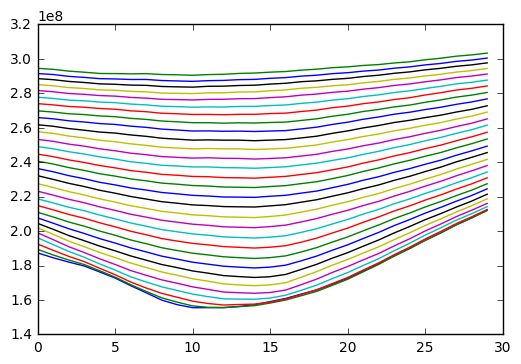

In [111]:
plot(deltas); None

In [136]:
def find_align(f0, f1,max_dx=30, max_dy=30):
    # Make a little low-pass donut filter
    k = np.zeros((3,3))
    k += 1
    k[1,1] = 0
    k /= np.sum(k)

    deltas = np.zeros((max_dy, max_dx))

    f0p = scipy.signal.convolve2d(f0, k, mode='same')
    f1p = scipy.signal.convolve2d(f1, k, mode='same')
    
    for dx in range(max_dx):
        for dy in range(max_dy):

            d = f1p[:-max_dy,:-max_dx] - f0p[dy:(dy-max_dy),dx:(dx-max_dx)]
            deltas[dy,dx] = np.sqrt(np.sum(d*d))

    return np.unravel_index(np.argmin(deltas), deltas.shape)

In [137]:
l = len(frames)
for i in range(l):
    for j in range(i+1,l):
        print "%d %d: %s" % (i,j, find_align(frames[i], frames[j]))

0 1: (12, 1)
0 2: (2, 0)
0 3: (2, 0)
0 4: (10, 0)
1 2: (0, 0)
1 3: (0, 0)
1 4: (0, 0)
2 3: (1, 0)
2 4: (9, 0)
3 4: (8, 0)


In [131]:
len(frames)

5

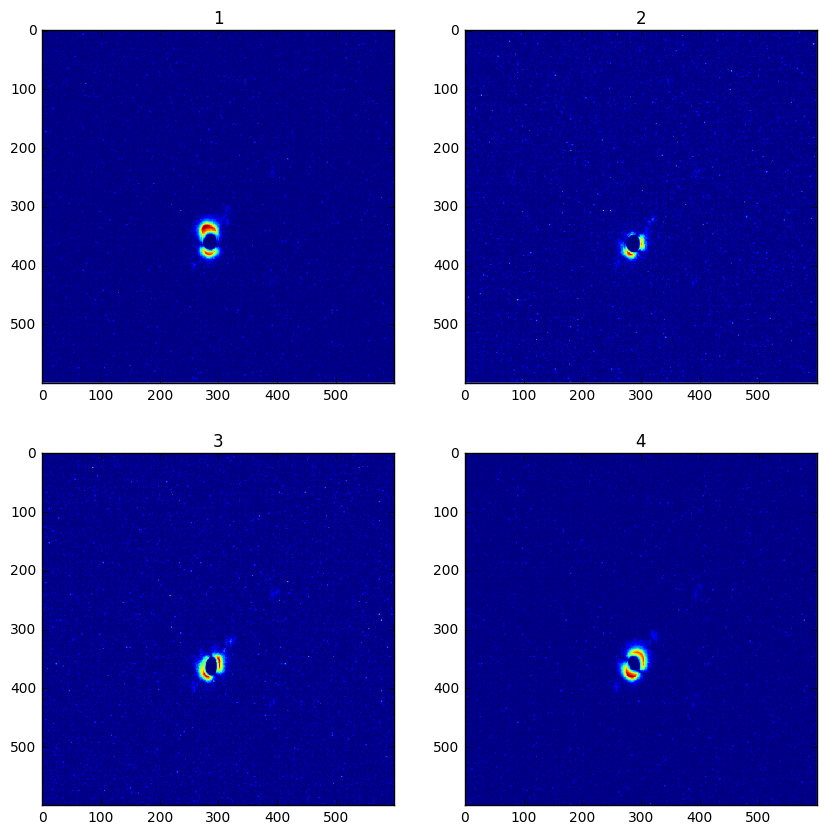

In [134]:
figure(figsize=(10,10))
for i in range(4):
    subplot(2,2,i+1)
    d = np.abs(frames[i+1] - frames[0])
    imshow(d, interpolation="none")
    title(i+1)